<a href="https://www.kaggle.com/code/thirumani/dragons-den-uk-data-analysis?scriptVersionId=194000850" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## <p style="background-color:maroon;color:white;font-size:24px;text-align:center;border-radius:10px 10px;font-weight:bold;border:2px solid #800080;"> 🇬🇧 Dragons' Den UK Exploratory Data Analysis (EDA) 🐉</p>
## Dataset https://www.kaggle.com/datasets/thirumani/dragons-den-uk-dataset

In [1]:
from IPython.display import IFrame
import datetime
print("Notebook was last executed on:", datetime.date.today().strftime("%Y-%b-%d"), "with Python version")
!python --version

Notebook was last executed on: 2024-Aug-25 with Python version
Python 3.10.14


In [2]:
# Source: Wikipedia
IFrame('https://upload.wikimedia.org/wikipedia/en/9/99/DragonsDenUK17.png', width=430, height=240)

## ⚒️ Importing Required Python Libraries

In [3]:
import warnings
warnings.filterwarnings('ignore')

import numpy as np
import pandas as pd
pd.set_option('display.max_columns', 50)

import matplotlib.pyplot as plt
import seaborn as sns
from babel.numbers import format_currency
from wordcloud import WordCloud, STOPWORDS
import geopandas as gpd
import plotly.express as px
import plotly.io as pio
pio.templates.default = "plotly_dark"
pio.renderers.default = 'notebook'

## ⏳ Check and import dataset

In [4]:
! ls -l /kaggle/input/dragons-den-uk-dataset/
dragons_den = pd.read_csv('/kaggle/input/dragons-den-uk-dataset/Dragons Den UK dataset.csv', encoding = "ISO-8859-1")

nRow, nCol = dragons_den.shape
print(f'\nThere are {nRow} rows and {nCol} columns in the dataset')

total 104
-rw-r--r-- 1 nobody nogroup 104408 Aug 25 10:29 'Dragons Den UK dataset.csv'

There are 494 rows and 56 columns in the dataset


## 💵 Exploratory Data Analysis (EDA)

In [5]:
dragons_den.head(5)

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present
0,1,Umbrolly,1,1.0,4-Jan-05,8-Feb-05,4-Jan-05,Business Services,Multimedia vending unit selling umbrellas and ...,NaN,NaN,BBC Two,NaN,NaN,NaN,NaN,Charles Ejogo,0,150000.0,40.0,375000.0,1,1.0,1.0,150000.0,...,NaN,NaN,NaN,75000.0,20.0,NaN,NaN,75000.0,20.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,NaN,NaN,NaN
1,1,GrailsLtd1,2,2.0,4-Jan-05,8-Feb-05,11-Jan-05,Fashion/Beauty,Tailor-made suits for businesswomen,NaN,NaN,BBC Two,NaN,NaN,NaN,NaN,Tracey Ann Graily,0,120000.0,40.0,300000.0,1,1.0,1.0,120000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,120000.0,40.0,"DougRichard,RachelElnaugh",NaN,NaN,NaN,NaN,NaN,NaN,2.0
2,1,LeBeanock,3,3.0,4-Jan-05,8-Feb-05,18-Jan-05,Lifestyle/Home,A beanbag hammock,NaN,NaN,BBC Two,NaN,NaN,NaN,NaN,Tracie Herrtage,0,54000.0,49.0,110204.0,1,1.0,1.0,54000.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54000.0,49.0,RachelElnaugh,NaN,NaN,NaN,NaN,NaN,NaN,1.0
3,1,"IVCam,IndustrialControlSystems",3,4.0,4-Jan-05,8-Feb-05,18-Jan-05,Business Services,A 3D measuring system using camera technology,NaN,NaN,BBC Two,NaN,NaN,NaN,NaN,John and Phillip Petty,1,50000.0,30.0,166667.0,1,1.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1,MycorrhizalSystems,4,5.0,4-Jan-05,8-Feb-05,25-Jan-05,Green/CleanTech,Land for a truffle farm,NaN,NaN,BBC Two,NaN,NaN,NaN,NaN,Paul Thomas,0,75000.0,25.0,300000.0,1,1.0,0.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
dragons_den.tail(10).T

,484,485,486,487,488,489,490,491,492,493
Season Number,1,1,1,1,1,1,1,1,1,1
Startup Name,Secured Sound,Rayink Limited,Cabtivate Media Ltd,EM Medical,Dinnerpoint.com,TechnoDeck,In-velope,Grid 108,Comatel,Toilet Snake
Episode Number,5,5,6,6,6,6,6,6,6,6
Pitch Number,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Season Start,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05,4-Jan-05
Season End,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05
Original Air Date,1-Feb-05,1-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05,8-Feb-05
Industry,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Business Description,Card reminder for doctors appointments,Canopy for pushing prams,Advertising and entertainment television servi...,Aid for musical spains and muscle aches,Dinner dating agency,Wheel ramps made from recycled tyres,Multi-purpose storage solution,Website creating 3D maps of cities for use as ...,Temporary repair for leaking water pipes,Toilet cleaning accessory
Company Website,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
dragons_den['Season Number'] = dragons_den['Season Number'].astype(pd.Int32Dtype())
dragons_den['Episode Number'] = dragons_den['Episode Number'].astype(pd.Int32Dtype())
dragons_den['Pitch Number'] = dragons_den['Pitch Number'].astype(pd.Int32Dtype())

dragons_den['Startup Name'] = dragons_den['Startup Name'].astype(str)
dragons_den['Industry'] = dragons_den['Industry'].astype(str)
dragons_den['Business Description'] = dragons_den['Business Description'].astype(str)

dragons_den['Multiple Entrepreneurs'] = dragons_den['Multiple Entrepreneurs'].astype(pd.Int32Dtype())
dragons_den['Received Offer'] = dragons_den['Received Offer'].astype(pd.Int32Dtype())
dragons_den['Accepted Offer'] = dragons_den['Accepted Offer'].astype(pd.Int32Dtype())
dragons_den['Deal Successful'] = dragons_den['Deal Successful'].astype(pd.Int32Dtype())

In [8]:
dragons_den.sample(10).style.set_properties(**{"background-color": "#2a9d8f","color":"white","border": "1px solid black", 'font-size': '10pt'})

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Dragons in Deal,Investment Amount Per Dragon,Equity Per Dragon,Royalty Deal,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present
452,1,Mandala Aroma,2,,4-Jan-05,8-Feb-05,11-Jan-05,nan,Organic aromatherapy skin products,nan,nan,nan,nan,nan,nan,nan,Gillian Kavannagh,0,50000.000000,10.000000,500000.000000,0,,,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
316,18,CordinaHair,11,317,1-Apr-21,8-Jul-21,10-Jun-21,nan,Heatless hair curling device,nan,3.370000,BBC One,nan,nan,nan,nan,Yanika Cordina,0,75000.000000,50.000000,150000.000000,1,1,1,75000.000000,50.000000,150000.000000,1.000000,75000.000000,50.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,75000.000000,50.000000,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan
303,18,TrappedintheWeb,6,304,1-Apr-21,8-Jul-21,6-May-21,nan,Online escape room gaming service,nan,3.430000,BBC One,nan,nan,nan,nan,Dave Murphy,0,30000.000000,10.000000,300000.000000,1,1,1,30000.000000,10.000000,300000.000000,1.000000,30000.000000,10.000000,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,30000.000000,10.000000,nan,nan,nan,nan,nan,nan,nan,nan,1.000000,nan
441,1,A-Frame Golf,5,,4-Jan-05,8-Feb-05,1-Feb-05,nan,Lighter and cheaper golf bag,nan,nan,nan,nan,nan,nan,nan,Jo Gascoigne,0,125000.000000,26.300000,475285.000000,1,0,,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
366,20,Un:hurd,7,367,5-Jan-23,6-Apr-23,16-Feb-23,Software/Tech,App promoting independent music artists,nan,3.820000,BBC One,nan,nan,nan,nan,Alex Brees,0,120000.000000,15.000000,800000.000000,1,1,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
383,20,MoodBears,14,384,5-Jan-23,6-Apr-23,6-Apr-23,Children/Education,Teddy bear brand,nan,2.920000,BBC One,nan,nan,nan,nan,Jo Proud,0,20000.000000,25.000000,80000.000000,1,1,1,20000.000000,25.000000,80000.000000,5.000000,4000.000000,5.000000,nan,nan,nan,nan,4000.000000,5.000000,4000.000000,5.000000,nan,nan,nan,nan,4000.000000,5.000000,4000.000000,5.000000,4000.000000,5.000000,StevenBartlett,1.000000,1.000000,nan,nan,1.000000,1.000000,1.000000
348,19,PrettyMamaBreastfeeding,13,349,16-Jan-22,7-Apr-22,31-Mar-22,Fashion/Beauty,Easy access maternity wear,nan,3.490000,BBC One,nan,nan,nan,nan,Alex and Jenny McFadden,1,30000.000000,33.000000,90909.000000,1,1,0,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
485,1,Rayink Limited,5,,4-Jan-05,8-Feb-05,1-Feb-05,nan,Canopy for pushing prams,nan,nan,nan,nan,nan,nan,nan,Yinka Davies,0,nan,nan,nan,0,,,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
474,1,Destination London,4,,4-Jan-05,8-Feb-05,25-Jan-05,nan,Taxi themed board g

In [9]:
dragons_den.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 494 entries, 0 to 493
Data columns (total 56 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Season Number                       494 non-null    Int32  
 1   Startup Name                        494 non-null    object 
 2   Episode Number                      494 non-null    Int32  
 3   Pitch Number                        416 non-null    Int32  
 4   Season Start                        494 non-null    object 
 5   Season End                          494 non-null    object 
 6   Original Air Date                   494 non-null    object 
 7   Industry                            494 non-null    object 
 8   Business Description                494 non-null    object 
 9   Company Website                     1 non-null      object 
 10  UK Viewership                       421 non-null    float64
 11  Channel Name                        441 non-n

In [10]:
dragons_den.describe().T.round(2).style.background_gradient(cmap = 'Oranges')

,count,mean,std,min,25%,50%,75%,max
Season Number,494.000000,12.500000,6.659420,1.000000,7.000000,14.000000,18.000000,21.000000
Episode Number,494.000000,6.311741,3.945365,1.000000,3.000000,6.000000,9.000000,16.000000
Pitch Number,416.000000,208.500000,120.233107,1.000000,104.750000,208.500000,312.250000,416.000000
UK Viewership,421.000000,3.183848,0.639146,1.630000,2.720000,3.200000,3.720000,4.390000
Pitchers Gender,0.000000,nan,nan,nan,nan,nan,nan,nan
Pitchers Average Age,0.000000,nan,nan,nan,nan,nan,nan,nan
Pitchers City,0.000000,nan,nan,nan,nan,nan,nan,nan
Pitchers State,0.000000,nan,nan,nan,nan,nan,nan,nan
Multiple Entrepreneurs,494.000000,0.388664,0.487941,0.000000,0.000000,0.000000,1.000000,1.000000
Original Ask Amount,462.000000,77977.283550,40584.897537,5.000000,50000.000000,75000.000000,100000.000000,250000.000000


In [11]:
# Unique values in each column
for col in dragons_den.columns:
    print("Number of unique values in", col, "-", dragons_den[col].nunique())

Number of unique values in Season Number - 21
Number of unique values in Startup Name - 494
Number of unique values in Episode Number - 16
Number of unique values in Pitch Number - 416
Number of unique values in Season Start - 21
Number of unique values in Season End - 21
Number of unique values in Original Air Date - 235
Number of unique values in Industry - 16
Number of unique values in Business Description - 494
Number of unique values in Company Website - 1
Number of unique values in UK Viewership - 141
Number of unique values in Channel Name - 2
Number of unique values in Pitchers Gender - 0
Number of unique values in Pitchers Average Age - 0
Number of unique values in Pitchers City - 0
Number of unique values in Pitchers State - 0
Number of unique values in Entrepreneur Names - 494
Number of unique values in Multiple Entrepreneurs - 2
Number of unique values in Original Ask Amount - 42
Number of unique values in Original Offered Equity - 36
Number of unique values in Valuation Re

In [12]:
# Latest/current season data
dragons_den_recent = dragons_den.loc[(dragons_den['Season Number']==21)]

In [13]:
# Data set information
print(dragons_den['Season Number'].max(), "total series/seasons in UK Dragons' Den")
print(dragons_den.groupby('Season Number')['Episode Number'].max().sum(), "total episodes, in all Dragons' Denk UK series")
print(dragons_den['Pitch Number'].max(), "#startups came for pitching \n")

21 total series/seasons in UK Dragons' Den
238 total episodes, in all Dragons' Denk UK series
416 #startups came for pitching 



Season Number   1   2   3   4   5   6   7   8   9   10  11  12  13  14  15  \
Episode Number   6   6   8   6   9   8   8  10  10  13  12  12  15  16  14   

Season Number   16  17  18  19  20  21  
Episode Number  15  14  14  14  14  14  


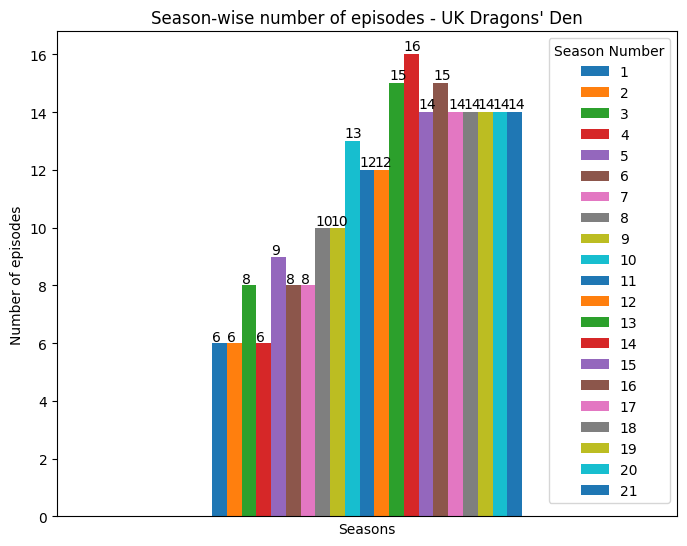

In [14]:
# Season-wise number of episodes
tmp = pd.pivot_table(dragons_den, values='Episode Number', columns='Season Number', aggfunc='max')
print(tmp)
ax = tmp.plot.bar(figsize=(8,6.3), title="Season-wise number of episodes - UK Dragons' Den")
plt.xlabel("Seasons")
plt.ylabel("Number of episodes")
plt.xticks([])
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

In [15]:
# Season-wise number of pitches
tmp = dragons_den['Season Number'].value_counts().sort_values()
fig = px.bar(tmp, x=tmp.values, title="<b> Dragons' Den UK - Season-wise number of pitches</b>", template='plotly_white', text=tmp, width=510, height=680)
fig.update_yaxes(tickvals=list(range(22)))
fig.update_xaxes(visible=False)
fig.show()

In [16]:
# There were 1 to 4 pitches, in a each episode
print(dragons_den[['Season Number','Episode Number']].value_counts().sort_values(ascending=True).unique())

[ 1  2  3  4  5 10 11]


In [17]:
# Types of industries, came for investments, in all seasons
tmp = dragons_den['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> Dragons' Den British - Industry wise startups (in all seasons)</b>", template='simple_white', text=tmp, width=850, height=700)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [18]:
# Types of industries, came for investment, in current/latest season (21st series)
tmp = dragons_den_recent['Industry'].value_counts().sort_values(ascending=True)
fig = px.bar(tmp, x=tmp.values, title="<b> UK Dragons' Den in current/latest season (21st series) - Industry wise startups</b>", template='simple_white', text=tmp, width=820, height=650)
fig.update_yaxes(title_text="")
fig.update_xaxes(visible=False)
fig.show()

In [19]:
# All seasons averages
pivot = pd.pivot_table(dragons_den, values=['Original Ask Amount','Total Deal Amount','Valuation Requested','Deal Valuation','Original Offered Equity','Total Deal Equity'], columns='Season Number', aggfunc=np.mean, sort=False)
pivot.style.format('{:.0f}')

# Amount & Valuation is in GBP and equity in %

Season Number,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21
Original Ask Amount,110897,142000,128125,94000,102667,102786,92000,88235,69375,85595,64500,71250,64354,64667,69038,68793,72154,60886,73607,64355,74035
Total Deal Amount,124750,155000,125000,93333,104000,89545,100000,93333,68571,71250,67143,60556,55714,61083,71071,75455,64000,60640,82500,66000,71765
Valuation Requested,676428,345000,352604,274385,316157,300476,323331,282668,206052,270451,237656,354363,261166,321966,310563,485663,444392,431443,391651,391836,857603
Deal Valuation,305676,387500,354166,302447,279236,244102,353912,302778,216580,239405,300079,425370,231731,377528,294958,596031,364893,452623,511551,426571,1013131
Original Offered Equity,25,41,39,37,36,36,34,33,40,33,32,26,30,24,27,27,25,22,26,21,17
Total Deal Equity,42,40,35,34,40,37,35,31,39,31,31,23,31,20,28,27,26,20,24,20,20


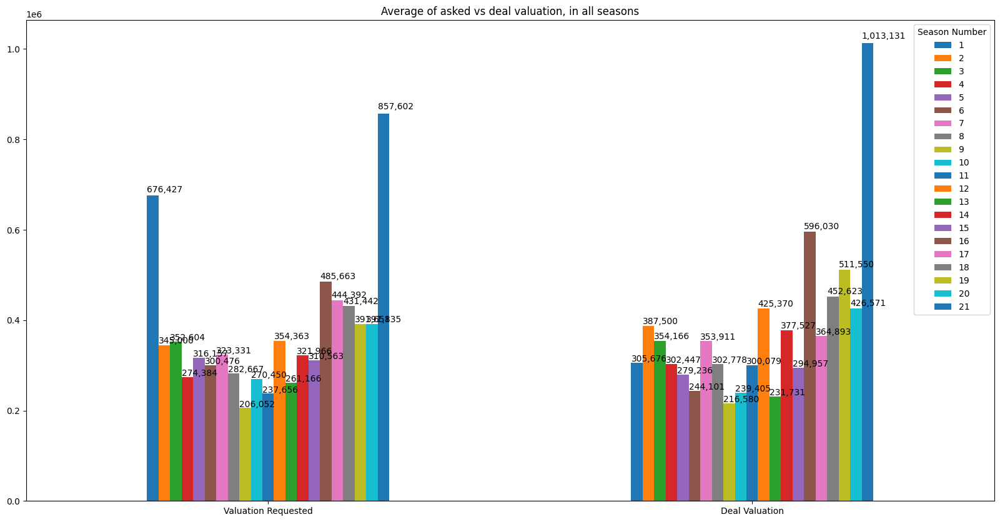

In [20]:
# All seasons average of offered/deal valuation
ax = pd.pivot_table(dragons_den, values=['Valuation Requested','Deal Valuation'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(20,10), title="Average of asked vs deal valuation, in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

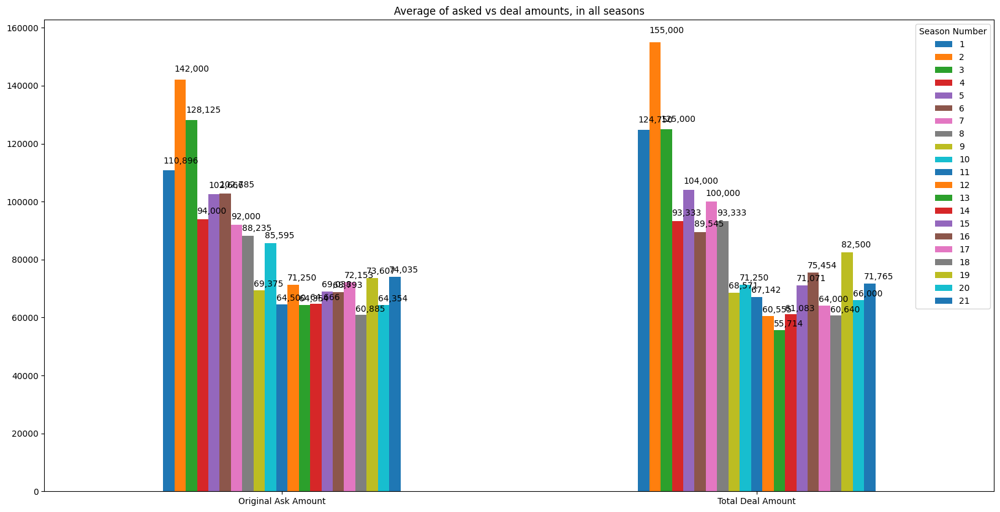

In [21]:
# All seasons average of offered/deal amounts
ax = pd.pivot_table(dragons_den, values=['Original Ask Amount','Total Deal Amount'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(20,10), title="Average of asked vs deal amounts, in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.02))

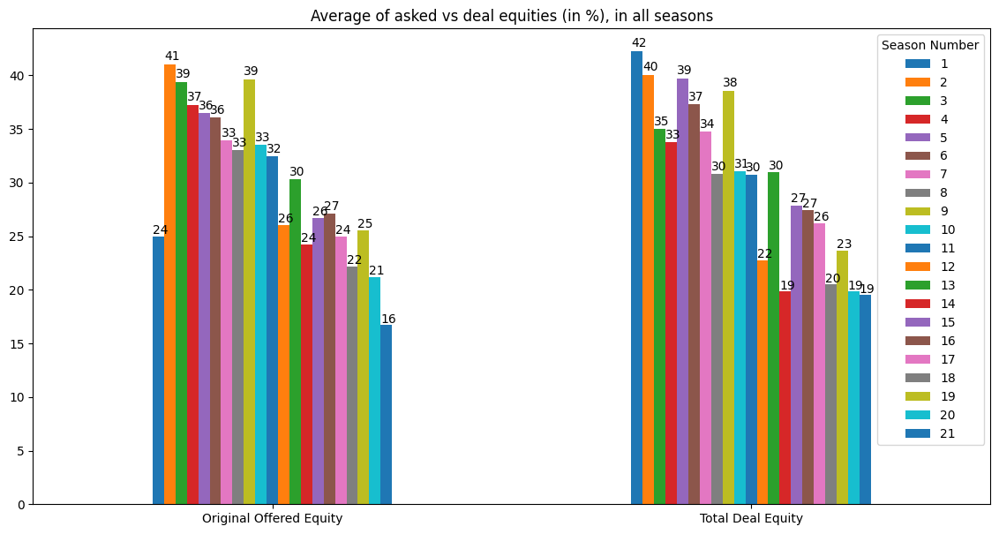

In [22]:
# All seasons average of offered/deal equities
ax = pd.pivot_table(dragons_den, values=['Original Offered Equity','Total Deal Equity'], columns='Season Number', aggfunc=np.mean, sort=False).plot.bar(figsize=(14,7), title="Average of asked vs deal equities (in %), in all seasons")
plt.xticks(rotation='horizontal')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.01))

In [23]:
# # Gender wise
# print(dragons_den['Pitchers Gender'].value_counts(),"\n")

# # In percentage
# print(round(dragons_den['Pitchers Gender'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

# plt.title("Pitchers Gender wise percentage")
# dragons_den["Pitchers Gender"].value_counts().plot(kind='pie', autopct='%.0f%%', colors=["lightblue", "pink", "gray"], shadow=True, fontsize=14)
# plt.ylabel('')

In [24]:
# # Age wise
# print(dragons_den['Pitchers Average Age'].value_counts(),"\n")

# # In percentage
# print(round(dragons_den['Pitchers Average Age'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False),"\n")

# plt.title("Pitchers Age wise percentage")
# dragons_den["Pitchers Average Age"].value_counts().plot(kind='pie', autopct='%.0f%%', cmap='tab20c', shadow=True, fontsize=14)
# plt.ylabel('')

### 💹 49% companies received offers and 51% startups could not convince Sharks to invest

Deal Successful
0    211
1    205
Name: count, dtype: Int64 

Deal Successful
0    51%
1    49%
Name: proportion, dtype: object


Text(0, 0.5, '')

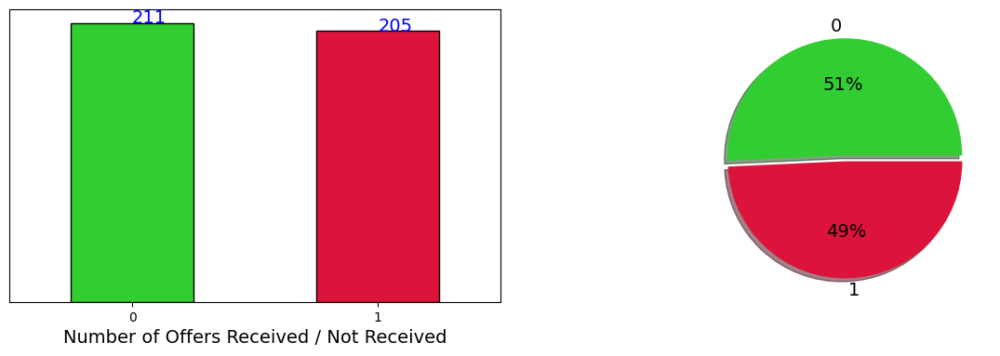

In [25]:
# Offers received
print(dragons_den['Deal Successful'].value_counts(), "\n")
print(round(dragons_den['Deal Successful'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
dragons_den["Deal Successful"].value_counts().plot(kind='bar', color=["limegreen","crimson"], ec="k")
plt.xlabel("Number of Offers Received / Not Received", size=14)
plt.yticks([])
plt.xticks(rotation=0)
for x,y in enumerate(dragons_den["Deal Successful"].value_counts()):
    plt.annotate(y, (x,y), fontsize=14, color="blue")

ax2 = plt.subplot(222)
dragons_den["Deal Successful"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["limegreen","crimson"], shadow=True, fontsize=14)
plt.ylabel('')

# 205 companies received offers & 211 startups could not convince #Dragons to invest.

In [26]:
# # Gender wise distribution, who received the offer
# print(dragons_den[dragons_den['Deal Successful']==1]['Pitchers Gender'].value_counts())
# plt.title("Gender wise distribution, who received the offer")
# dragons_den[dragons_den['Deal Successful']==1]['Pitchers Gender'].value_counts().sort_values(ascending=False).plot.pie(autopct='%.0f%%',colors=["blue", "yellow", "orange"], fontsize=14)
# plt.ylabel('')

In [27]:
# # Gender wise distribution, who could NOT receive the offer
# print(dragons_den[dragons_den['Deal Successful']==0]['Pitchers Gender'].value_counts())
# plt.title("Gender wise distribution, who could NOT receive the offer")
# dragons_den[dragons_den['Deal Successful']==0]['Pitchers Gender'].value_counts().sort_values(ascending=False).plot.pie(autopct='%.0f%%', fontsize=14)
# plt.ylabel('')

In [28]:
# Maximum amount requested
print("Maximum amount requested, by a pitcher -", format_currency(dragons_den['Original Ask Amount'].max(), 'GBP', locale='en_UK').replace(".00", ""))

Maximum amount requested, by a pitcher - £250,000


In [29]:
# Least amount requested
print("Least amount requested, by a pitcher -", format_currency(dragons_den['Original Ask Amount'].min(), 'GBP', locale='en_UK').replace(".00", ""))

Least amount requested, by a pitcher - £5


In [30]:
# Sum of investment amount asked, in Dragons' Den UK
print("Sum of investment amount asked, by all startup companies, in UK Dragons' Den -", format_currency(dragons_den['Original Ask Amount'].sum(), 'GBP', locale='en_UK').replace(".00", ""))

Sum of investment amount asked, by all startup companies, in UK Dragons' Den - £36,025,505


In [31]:
# Amount invested by all Dragons, in UK Dragons' Den
print("Amount invested by all Dragons, in Dragons' Den UK -", format_currency(dragons_den['Total Deal Amount'].sum(), 'GBP', locale='en_UK').replace(".00", ""))

Amount invested by all Dragons, in Dragons' Den UK - £15,299,005


In [32]:
# Sum of loan/debt amount, in American Dragons' Den
print("Sum of loan/debt amount, given by all Dragons, in American Dragons' Den -", format_currency(dragons_den['Loan'].sum(), 'GBP', locale='en_UK').replace(".00", ""))

Sum of loan/debt amount, given by all Dragons, in American Dragons' Den - £0


In [33]:
# Top 15 investments, as per total investment/deal amount
print(dragons_den.groupby('Startup Name')['Total Deal Amount'].max().nlargest(15))

tmpdf = dragons_den.sort_values('Total Deal Amount', ascending=False)[0:15]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Amount', color="Startup Name", title="Highest investment as per deal amount", text=tmpdf['Total Deal Amount'].map(float).map(str))
fig.show()

Startup Name
KimaÃ¯                        250000.0
GamingAlerts                  200000.0
ProWasteManagementServices    200000.0
TheWandCompany                200000.0
VisualTalentLtd               175000.0
Igloo                         160000.0
TheGeneratingCompany          160000.0
BigClothing4You               150000.0
Cheesegeek                    150000.0
ElectroExpo                   150000.0
ExtendRobotics                150000.0
MixAlbum                      150000.0
MoBros                        150000.0
Rapstrap                      150000.0
SquareMile                    150000.0
Name: Total Deal Amount, dtype: float64


In [34]:
# Top 20 investments, as per total equity/shares percentage diluted
print(dragons_den.groupby('Startup Name')['Total Deal Equity'].max().nlargest(20))

tmpdf = dragons_den.sort_values('Total Deal Equity', ascending=False)[0:20]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Highest investment as per equity percentage", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name
RKARecords                 79.0
BareNakedFoods             50.0
BeamBlock                  50.0
Blindsinabox               50.0
CaribbeanReadyMeals        50.0
CordinaHair                50.0
FitFurLife                 50.0
Liquiproof                 50.0
Rapstrap                   50.0
TPlus                      50.0
BeachPowderLtd             49.0
LeBeanock                  49.0
Sweet-EscottAviationLtd    49.0
LittleHoppabySophie        45.0
LoveDaPop                  45.0
Nimble                     45.0
ParkingPerx                45.0
PeggyRainLtd               45.0
RemPods                    45.0
SlappieLtd                 45.0
Name: Total Deal Equity, dtype: float64


In [35]:
# Startups who sold (exactly) 1/3rd of their company (equity) to Dragons
print(dragons_den.loc[dragons_den['Total Deal Equity'] == 33.3][["Startup Name"]].count())
print(dragons_den.loc[dragons_den['Total Deal Equity'] == 33.3][["Season Number","Startup Name", "Total Deal Equity"]])

tmpdf = dragons_den.loc[dragons_den['Total Deal Equity'] == 33.3]
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Startups who sold 1/3rd of their company", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name    3
dtype: int64
     Season Number            Startup Name  Total Deal Equity
120             10  ATurner&SonsSausageLtd               33.3
174             13                  Yogiyo               33.3
260             16             DidsburyGin               33.3


In [36]:
# Startups who sold more than 1/3rd of their company (equity) to Sharks
print(dragons_den.loc[dragons_den['Total Deal Equity'] > 32 ][["Startup Name"]].count())
print(dragons_den.loc[dragons_den['Total Deal Equity'] > 32 ][["Season Number","Startup Name","Total Deal Amount", "Total Deal Equity"]])

tmpdf = dragons_den.loc[dragons_den['Total Deal Equity'] > 32 ].sort_values('Total Deal Equity', ascending=False)
fig = px.bar(tmpdf, x="Startup Name", y='Total Deal Equity', color="Startup Name", title="Startups who sold more than 1/3rd of their company", text=tmpdf['Total Deal Equity'].map(int).map(str) + "%")
fig.show()

Startup Name    66
dtype: int64
     Season Number     Startup Name  Total Deal Amount  Total Deal Equity
0                1         Umbrolly           150000.0               40.0
1                1       GrailsLtd1           120000.0               40.0
2                1        LeBeanock            54000.0               49.0
7                1  VisualTalentLtd           175000.0               40.0
8                2       SquareMile           150000.0               40.0
..             ...              ...                ...                ...
363             20        HazeCards            35000.0               35.0
385             21     PeggyRainLtd            80000.0               45.0
397             21      PavanBeauty            50000.0               40.0
423             21  ZebedeeAnyAngle            75000.0               40.0
440             21     YardArtUKLtd            50000.0               35.0

[66 rows x 4 columns]


In [37]:
# # Startups who got Debt/loan amount
# print("Number of startups who got debt/loan amount", dragons_den['Loan'].count(),"\n")

# dragons_den.loc[dragons_den['Loan'] >= 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity","Loan"]]

In [38]:
# # Startups who gave Royalty
# print("Number of startups who gave Royalty", dragons_den['Royalty Deal'].count(),"\n")

# dragons_den.loc[dragons_den['Royalty Deal'] == 1][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

In [39]:
# Startups who gave Advisory shares
print("Number of startups who gave Advisory shares/equity", dragons_den['Advisory Shares Equity'].count(),"\n")

dragons_den.loc[dragons_den['Advisory Shares Equity'] > 0][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity", "Advisory Shares Equity"]]

Number of startups who gave Advisory shares/equity 1 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity,Advisory Shares Equity
419,21,Sibstar,125000.0,10.0,10.0


In [40]:
# Deals with conditions
print("Number of startups who accepted conditional deals", dragons_den['Deal Has Conditions'].count(),"\n")

dragons_den.loc[dragons_den['Deal Has Conditions'] == 'yes'][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]]

Number of startups who accepted conditional deals 37 



,Season Number,Startup Name,Total Deal Amount,Total Deal Equity
8,2,SquareMile,150000.0,40.0
115,10,InternAvenue,100000.0,40.0
117,10,WoodBlocX,75000.0,25.0
133,11,RemPods,100000.0,45.0
156,12,ZevenMedia,50000.0,25.0
167,13,Accentuate,45000.0,40.0
169,13,Sync-box,55000.0,35.0
192,14,Iveson&Sage,78000.0,25.0
193,14,TheSnafflingPig,70000.0,20.0
195,14,Cocofina,75000.0,20.0


In [41]:
# # Gender/age wise pitchers combination
# dragons_den.groupby([dragons_den['Pitchers Gender'], dragons_den['Pitchers Average Age'], dragons_den['Multiple Entrepreneurs']]).size().nlargest(10)

# # Groups/Couples in middle age is most frequent combination followed by Male/Female in middle age

## 💰 Which shark invested most ?

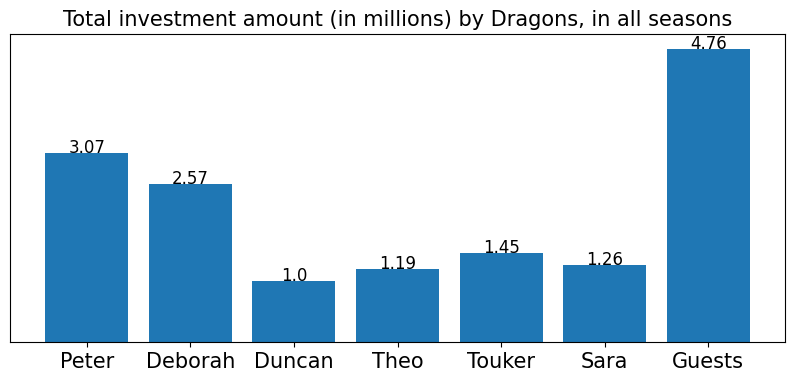

In [42]:
# Amount Invested by Dragons, in all seasons
Amount = [(dragons_den['Peter Jones Investment Amount']/1000000).sum(), (dragons_den['Deborah Meaden Investment Amount']/1000000).sum(), (dragons_den['Duncan Bannatyne Investment Amount']/1000000).sum(), (dragons_den['Theo Paphitis Investment Amount']/1000000).sum(),
    (dragons_den['Touker Suleyman Investment Amount']/1000000).sum(), (dragons_den['Sara Davies Investment Amount']/1000000).sum(), (dragons_den['Guest Investment Amount']/1000000).sum()]
name=['Peter','Deborah','Duncan','Theo','Touker','Sara','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'])
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y=d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total investment amount (in millions) by Dragons, in all seasons", fontsize=15)
plt.show()

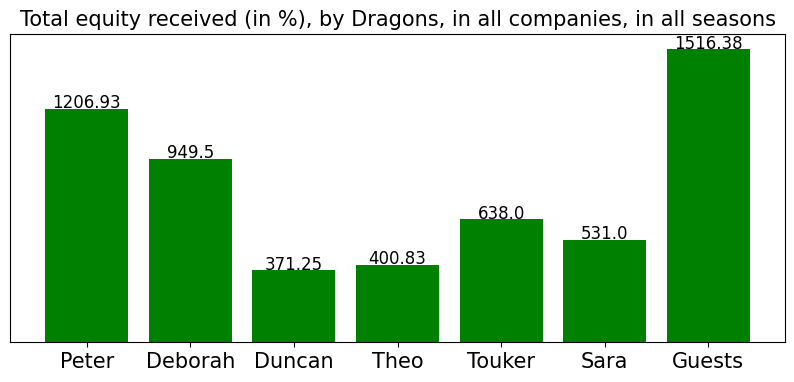

In [43]:
# Equity received by Dragons, in all seasons
Equity = [dragons_den['Peter Jones Investment Equity'].sum(), dragons_den['Deborah Meaden Investment Equity'].sum(), dragons_den['Duncan Bannatyne Investment Equity'].sum(), dragons_den['Theo Paphitis Investment Equity'].sum(),
    dragons_den['Touker Suleyman Investment Equity'].sum(), dragons_den['Sara Davies Investment Equity'].sum(), dragons_den['Guest Investment Equity'].sum()]
name=['Peter','Deborah','Duncan','Theo','Touker','Sara','Guests']
df = {'Name':name, 'Total Equity':Equity}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Equity'], color='g')
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Equity):
    plt.text(x=index, y =d+2, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total equity received (in %), by Dragons, in all companies, in all seasons", fontsize=15)
plt.show()

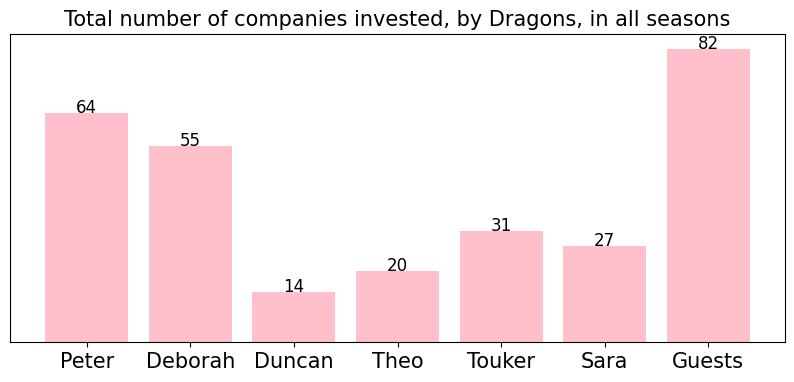

In [44]:
# Number of companies invested, in all seasons
Amount = [(dragons_den['Peter Jones Investment Amount']).count(), (dragons_den['Deborah Meaden Investment Amount']).count(), (dragons_den['Duncan Bannatyne Investment Amount']).count(), (dragons_den['Theo Paphitis Investment Amount']).count(),
    (dragons_den['Touker Suleyman Investment Amount']).count(), (dragons_den['Sara Davies Investment Amount']).count(), (dragons_den['Guest Investment Amount']).count()]
name=['Peter','Deborah','Duncan','Theo','Touker','Sara','Guests']
df = {'Name':name, 'Total Amount':Amount}
plt.figure(figsize=(10,4))
plt.bar(df['Name'], df['Total Amount'], color='pink')
plt.xticks(fontsize=15)
plt.yticks([])
for index,d in enumerate(Amount):
    plt.text(x=index, y=d, s=f"{round(d,2)}", ha = 'center', fontdict=dict(fontsize=12))
plt.title("Total number of companies invested, by Dragons, in all seasons", fontsize=15)
plt.show()

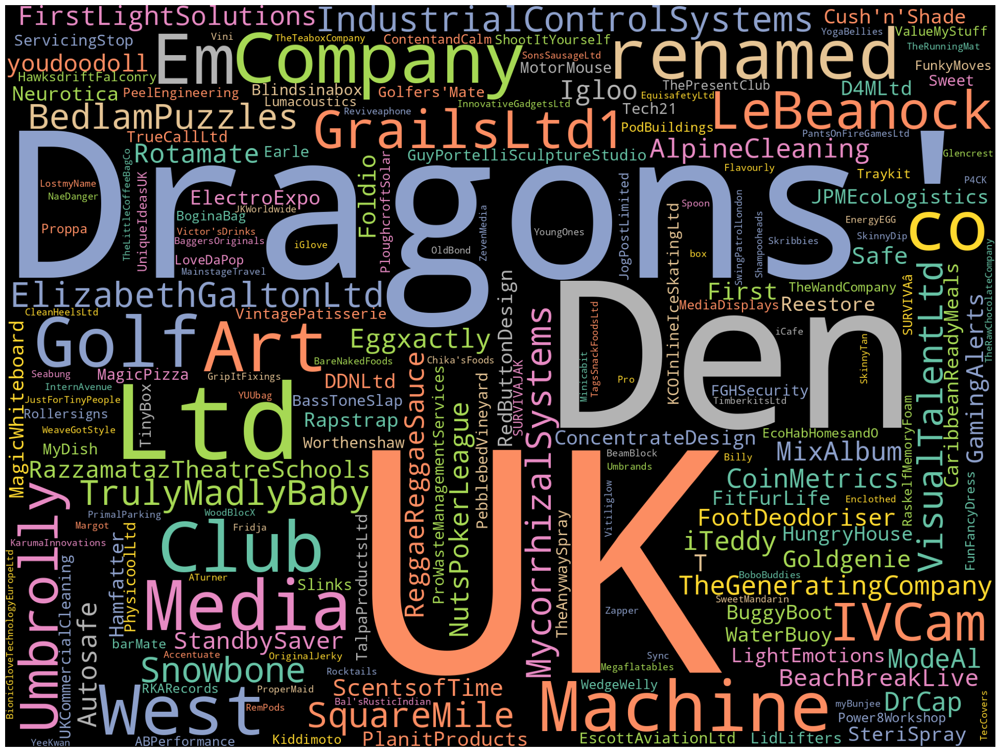

In [45]:
# Word cloud based on Startup Names, in all seasons
text = " Dragons' Den UK ".join(cat for cat in dragons_den['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='black', colormap='Set2', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

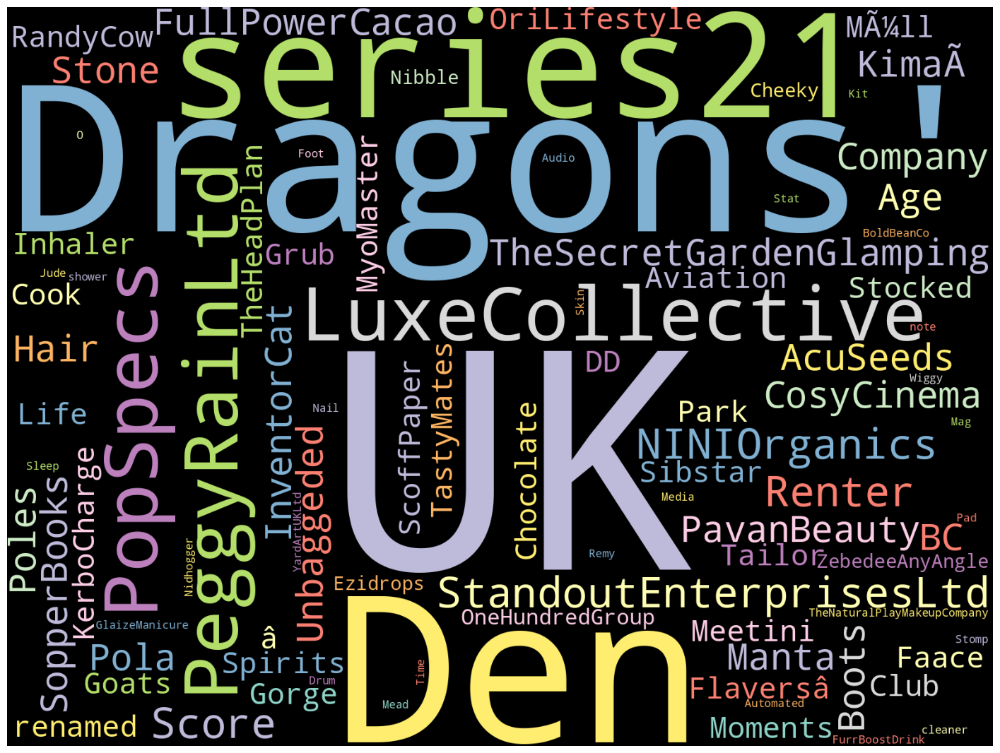

In [46]:
# Word cloud based on Startup Names, in current/latest season (21st season)
text = " Dragons' Den UK series21 ".join(cat for cat in dragons_den_recent['Startup Name'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=1600, height=1200, stopwords=stop_words, background_color='black', colormap='Set3', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(18,15))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

## 🔎 Shark Tank India Dataset https://www.kaggle.com/datasets/thirumani/shark-tank-india

## 🔥 Peter Jones's Investments

Total investments by Peter Jones  64
Investment amount by Peter Jones £3,073,834.33
Equity received by Peter Jones 1206.93 % in different companies

Company details:
------------------------------------------------------------------------------------------
                 Startup Name                Industry  Peter Jones Investment Amount
                     Umbrolly       Business Services                    75000.00000
              VisualTalentLtd          Fashion/Beauty                   175000.00000
                   SquareMile          Lifestyle/Home                    75000.00000
         TheGeneratingCompany Fitness/Sports/Outdoors                    80000.00000
            ReggaeReggaeSauce       Food and Beverage                    25000.00000
                       iTeddy       Business Services                    70000.00000
                 ScentsofTime          Fashion/Beauty                    40000.00000
            ConcentrateDesign      Children/Education          

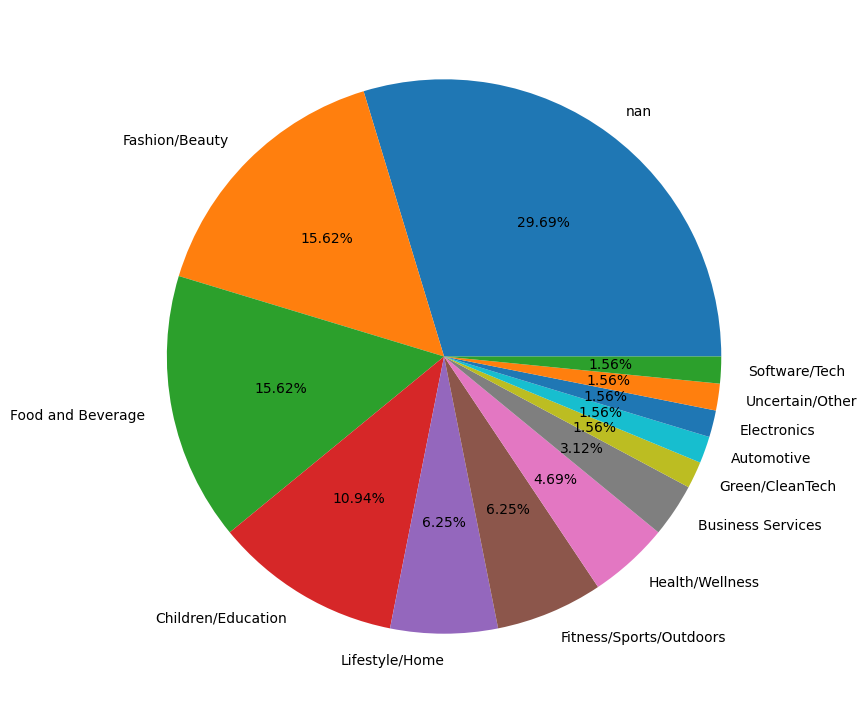

In [47]:
print("Total investments by Peter Jones", dragons_den[dragons_den['Peter Jones Investment Amount']>0][['Peter Jones Investment Amount']].count().to_string()[-3:])
print("Investment amount by Peter Jones", format_currency(dragons_den['Peter Jones Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by Peter Jones", round(dragons_den['Peter Jones Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(dragons_den.loc[dragons_den['Peter Jones Investment Amount']>0][["Startup Name","Industry","Peter Jones Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nPeter Jones industry wise investments\n")
print(dragons_den[dragons_den['Peter Jones Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Peter Jones Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Peter Jones Investment Amount']>0] [["Startup Name","Peter Jones Investment Amount","Peter Jones Investment Equity"]].sort_values(by="Peter Jones Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Peter Jones Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎇 Deborah Meaden's Investments

Total investments by Deborah Meaden  55
Investment amount by Deborah Meaden £2,572,167.67
Equity received by Deborah Meaden 949.5 % in different companies

Company details:
------------------------------------------------------------------------------------------
              Startup Name                Industry  Deborah Meaden Investment Amount
                  MixAlbum           Software/Tech                       75000.00000
                youdoodoll      Children/Education                       35000.00000
                  Reestore         Green/CleanTech                       25000.00000
                SteriSpray          Fashion/Beauty                       72500.00000
           JPMEcoLogistics              Automotive                       50000.00000
                 BuggyBoot       Business Services                       80000.00000
           MagicWhiteboard      Children/Education                       50000.00000
ProWasteManagementServices         Green/CleanTech      

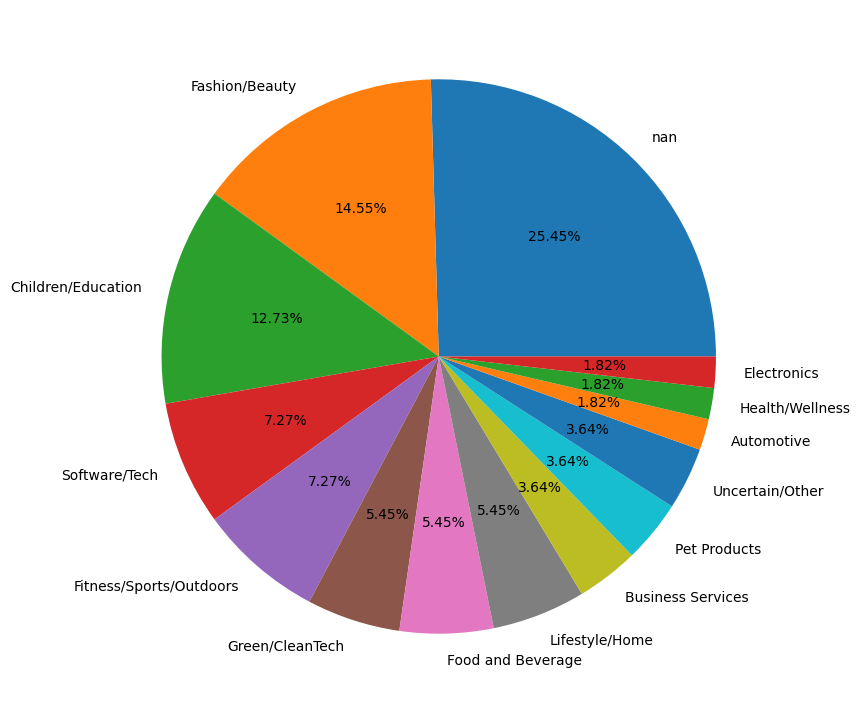

In [48]:
print("Total investments by Deborah Meaden", dragons_den[dragons_den['Deborah Meaden Investment Amount']>0][['Deborah Meaden Investment Amount']].count().to_string()[-3:])
print("Investment amount by Deborah Meaden", format_currency(dragons_den['Deborah Meaden Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by Deborah Meaden", round(dragons_den['Deborah Meaden Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(dragons_den.loc[dragons_den['Deborah Meaden Investment Amount']>0][["Startup Name","Industry","Deborah Meaden Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nDeborah Meaden industry wise investments\n")
print(dragons_den[dragons_den['Deborah Meaden Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Deborah Meaden Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Deborah Meaden Investment Amount']>0] [["Startup Name","Deborah Meaden Investment Amount","Deborah Meaden Investment Equity"]].sort_values(by="Deborah Meaden Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Deborah Meaden Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ✳️ Duncan Bannatyne's Investments

Total investments by Duncan Bannatyne  14
Investment amount by Duncan Bannatyne £995,000
Equity received by Duncan Bannatyne 371.25 % in different companies

Company details:
------------------------------------------------------------------------------------------
              Startup Name           Industry  Duncan Bannatyne Investment Amount
                  Umbrolly  Business Services                             75000.0
                     Igloo  Business Services                             80000.0
  RazzamatazTheatreSchools Children/Education                             50000.0
       CaribbeanReadyMeals  Food and Beverage                             50000.0
               ElectroExpo        Electronics                             75000.0
                    D4MLtd  Business Services                             37500.0
                  Rapstrap    Green/CleanTech                             75000.0
              Blindsinabox     Lifestyle/Home                             2000

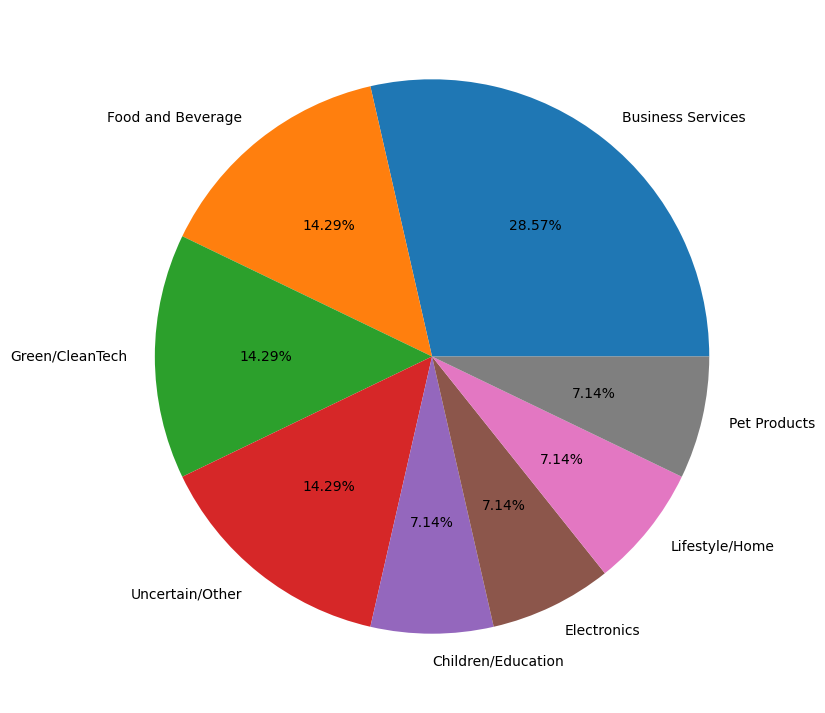

In [49]:
print("Total investments by Duncan Bannatyne", dragons_den[dragons_den['Duncan Bannatyne Investment Amount']>0][['Duncan Bannatyne Investment Amount']].count().to_string()[-3:])
print("Investment amount by Duncan Bannatyne", format_currency(dragons_den['Duncan Bannatyne Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by Duncan Bannatyne", round(dragons_den['Duncan Bannatyne Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(dragons_den.loc[dragons_den['Duncan Bannatyne Investment Amount']>0][["Startup Name","Industry","Duncan Bannatyne Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nDuncan Bannatyne industry wise investments\n")
print(dragons_den[dragons_den['Duncan Bannatyne Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Duncan Bannatyne Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Duncan Bannatyne Investment Amount']>0] [["Startup Name","Duncan Bannatyne Investment Amount","Duncan Bannatyne Investment Equity"]].sort_values(by="Duncan Bannatyne Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Duncan Bannatyne Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🚀 Theo Paphitis's Investments

Total investments by Theo Paphitis  20
Investment amount by Theo Paphitis £1,191,666.67
Equity received by Theo Paphitis 400.83 % in different companies

Company details:
------------------------------------------------------------------------------------------
              Startup Name                Industry  Theo Paphitis Investment Amount
                SquareMile          Lifestyle/Home                      75000.00000
      TheGeneratingCompany Fitness/Sports/Outdoors                      80000.00000
                  MixAlbum           Software/Tech                      75000.00000
                    iTeddy       Business Services                      70000.00000
                    Foldio          Lifestyle/Home                      80000.00000
              ScentsofTime          Fashion/Beauty                      40000.00000
              GamingAlerts           Software/Tech                     200000.00000
                  Reestore         Green/CleanTech                

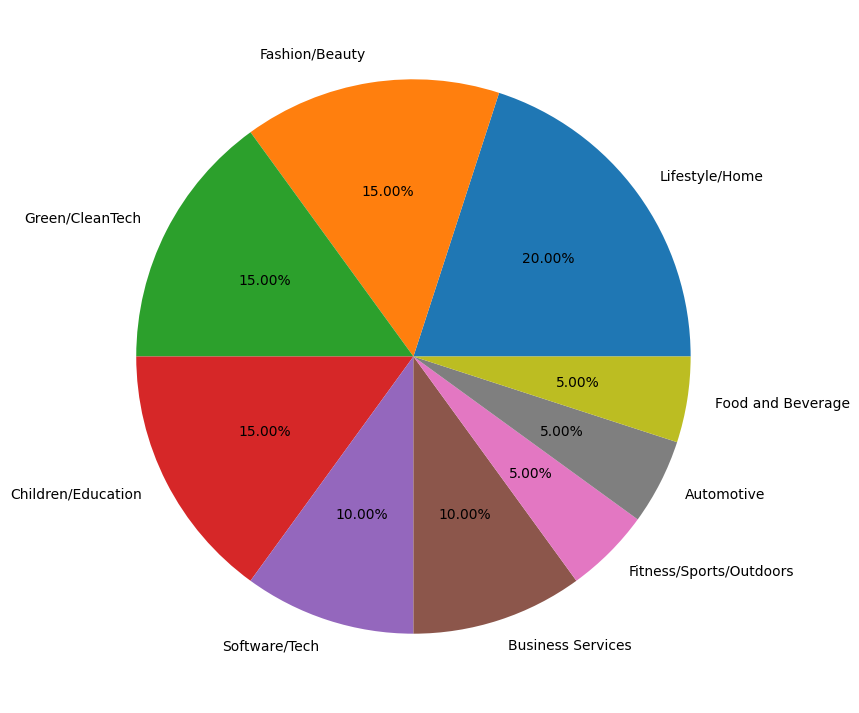

In [50]:
print("Total investments by Theo Paphitis", dragons_den[dragons_den['Theo Paphitis Investment Amount']>0][['Theo Paphitis Investment Amount']].count().to_string()[-3:])
print("Investment amount by Theo Paphitis", format_currency(dragons_den['Theo Paphitis Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by Theo Paphitis", round(dragons_den['Theo Paphitis Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(dragons_den.loc[dragons_den['Theo Paphitis Investment Amount']>0][["Startup Name","Industry","Theo Paphitis Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nTheo Paphitis industry wise investments\n")
print(dragons_den[dragons_den['Theo Paphitis Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Theo Paphitis Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Theo Paphitis Investment Amount']>0] [["Startup Name","Theo Paphitis Investment Amount","Theo Paphitis Investment Equity"]].sort_values(by="Theo Paphitis Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Theo Paphitis Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎾  Touker Suleyman's Investments

Total investments by Touker Suleyman  31
Investment amount by Touker Suleyman £1,450,334.33
Equity received by Touker Suleyman 638.0 % in different companies

Company details:
------------------------------------------------------------------------------------------
            Startup Name                Industry  Touker Suleyman Investment Amount
               BeamBlock Fitness/Sports/Outdoors                        25000.00000
           TimberkitsLtd      Children/Education                        40000.00000
              Liquiproof          Fashion/Beauty                       100000.00000
              BadBrownie       Food and Beverage                        60000.00000
               BootBuddy          Fashion/Beauty                        20000.00000
       KokosoSkinLimited          Fashion/Beauty                        50000.00000
   TheWoolCoutureCompany       Business Services                        25000.00000
           Nana'sManners      Children/Education             

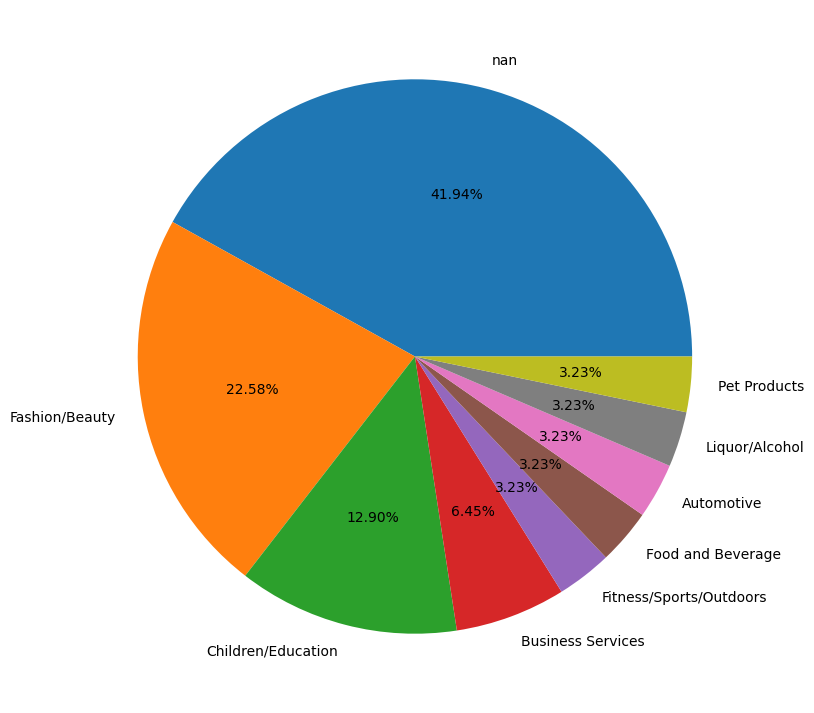

In [51]:
print("Total investments by Touker Suleyman", dragons_den[dragons_den['Touker Suleyman Investment Amount']>0][['Touker Suleyman Investment Amount']].count().to_string()[-3:])
print("Investment amount by Touker Suleyman", format_currency(dragons_den['Touker Suleyman Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by Touker Suleyman", round(dragons_den['Touker Suleyman Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(dragons_den.loc[dragons_den['Touker Suleyman Investment Amount']>0][["Startup Name","Industry","Touker Suleyman Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nTouker Suleyman industry wise investments\n")
print(dragons_den[dragons_den['Touker Suleyman Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Touker Suleyman Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Touker Suleyman Investment Amount']>0] [["Startup Name","Touker Suleyman Investment Amount","Touker Suleyman Investment Equity"]].sort_values(by="Touker Suleyman Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Touker Suleyman Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## ⭐ Sara Davies's Investments

Total investments by Sara Davies  27
Investment amount by Sara Davies £1,256,667.67
Equity received by Sara Davies 531.0 % in different companies

Company details:
------------------------------------------------------------------------------------------
       Startup Name           Industry  Sara Davies Investment Amount
           Tancream                nan                    37500.00000
             MakTok                nan                    60000.00000
           PipeEasy                nan                    41000.00000
    DrynksUnlimited                nan                   125000.00000
             Nimble                nan                    28333.33333
            Fliptop                nan                    10000.00000
         PeachyLean                nan                    33333.33333
    TrappedintheWeb                nan                    30000.00000
     BeachPowderLtd     Fashion/Beauty                    30000.00000
         WillsowLtd                nan       

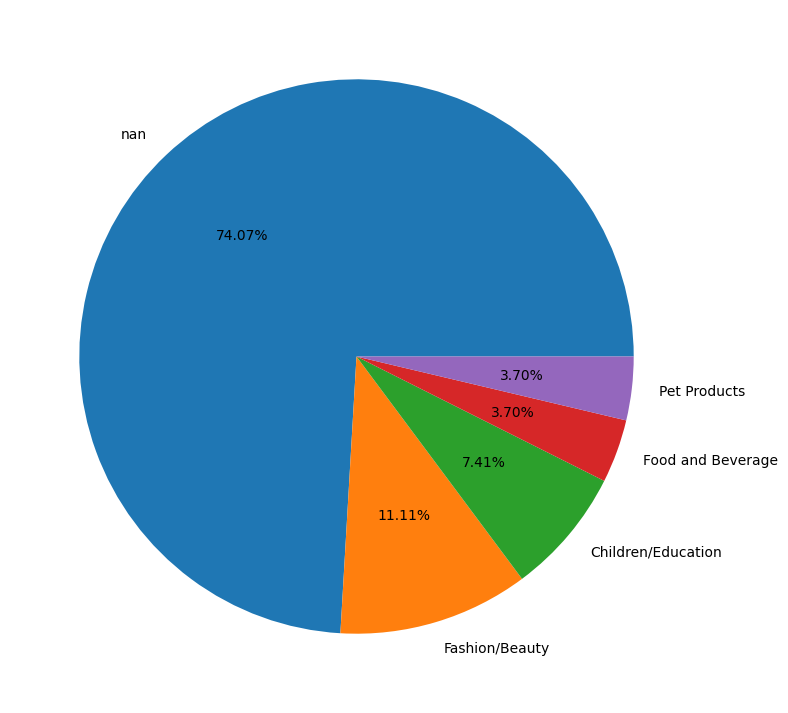

In [52]:
print("Total investments by Sara Davies", dragons_den[dragons_den['Sara Davies Investment Amount']>0][['Sara Davies Investment Amount']].count().to_string()[-3:])
print("Investment amount by Sara Davies", format_currency(dragons_den['Sara Davies Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by Sara Davies", round(dragons_den['Sara Davies Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*90)
print(dragons_den.loc[dragons_den['Sara Davies Investment Amount']>0][["Startup Name","Industry","Sara Davies Investment Amount"]].to_string(index=False))
print('-'*90)

print("\nSara Davies industry wise investments\n")
print(dragons_den[dragons_den['Sara Davies Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Sara Davies Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Sara Davies Investment Amount']>0] [["Startup Name","Sara Davies Investment Amount","Sara Davies Investment Equity"]].sort_values(by="Sara Davies Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Sara Davies Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

## 🎆 All Guest's Investments
#### (Dragon who presented in fewer seasons)

Total investments by all Guests 82
Investment amount by all Guests £4,759,334.33
Equity received by all Guests 1516.38 % in different companies

Company details:
--------------------------------------------------------------------------------------------
                 Startup Name                Industry  Guest Investment Amount         Invested Guest Name
                   GrailsLtd1          Fashion/Beauty             120000.00000   DougRichard,RachelElnaugh
                    LeBeanock          Lifestyle/Home              54000.00000               RachelElnaugh
          FirstLightSolutions       Business Services             100000.00000             RichardFarleigh
            ReggaeReggaeSauce       Food and Beverage              25000.00000             RichardFarleigh
                        Igloo       Business Services              80000.00000             RichardFarleigh
                    Goldgenie          Lifestyle/Home              60000.00000                   JamesC

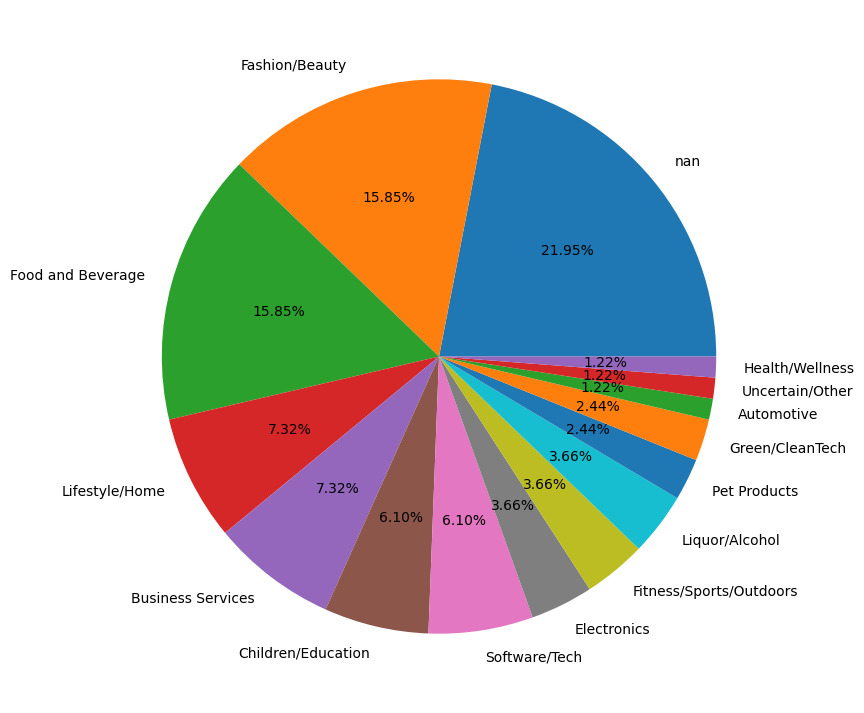

In [53]:
print("Total investments by all Guests", dragons_den[dragons_den['Guest Investment Amount']>0][['Guest Investment Amount']].count().to_string()[-2:])
print("Investment amount by all Guests", format_currency(dragons_den['Guest Investment Amount'].sum(), 'GBP', locale='en_US').replace(".00", ""))
print("Equity received by all Guests", round(dragons_den['Guest Investment Equity'].sum(), 2), "% in different companies")

print("\nCompany details:")
print('-'*92)
print(dragons_den.loc[dragons_den['Guest Investment Amount']>0][["Startup Name","Industry","Guest Investment Amount","Invested Guest Name"]].to_string(index=False))
print('-'*92)

print("\nAll Guests industry wise investments\n")
print(dragons_den[dragons_den['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False))
plt.figure(figsize = (15,9))
dragons_den[dragons_den['Guest Investment Amount']>0]['Industry'].value_counts().sort_values(ascending=False).plot.pie(autopct='%1.2f%%')
plt.ylabel('')
plt.show()

tmpdf = dragons_den.loc[dragons_den['Guest Investment Amount']>0] [["Startup Name","Guest Investment Amount","Guest Investment Equity"]].sort_values(by="Guest Investment Equity")
fig = px.treemap(tmpdf, path=['Startup Name'], values=tmpdf['Guest Investment Amount'], width=850, height=800)
fig.update_layout(margin = dict(t=5, l=5, r=5, b=5))
fig.update_traces(textposition='middle center')
fig.show()

In [54]:
# Guest sharks and number of companies they invested
dragons_den.loc[dragons_den['Guest Investment Amount'] > 1]['Invested Guest Name'].str.split(',').explode('Invested Guest Name').value_counts().sort_values(ascending=False)

Invested Guest Name
TejLalvani         20
StevenBartlett     19
JamesCaan          11
NickJenkins         9
JennyCampbell       7
KellyHoppen         5
PiersLinney         4
SarahWillingham     4
RichardFarleigh     3
RachelElnaugh       2
HilaryDevey         2
DougRichard         1
EmmaGrede           1
Name: count, dtype: int64

In [55]:
# Investment amount by guests, in GBP
tmpdf = dragons_den.loc[dragons_den['Guest Investment Amount'] > 0][['Invested Guest Name','Guest Investment Amount']]
tmpdf['Number of Guests'] = tmpdf['Invested Guest Name'].str.count(',') + 1
tmpdf['Invetested Amount per Guest'] = tmpdf['Guest Investment Amount'] / tmpdf['Number of Guests']
tmpdf = tmpdf.set_index(tmpdf.columns.drop('Invested Guest Name',1).tolist())['Invested Guest Name'].str.split(',', expand=True).stack().reset_index().rename(columns={0:'Invested Guest Name'}).loc[:, tmpdf.columns]
round(tmpdf.groupby(["Invested Guest Name"])["Invetested Amount per Guest"].sum().sort_values(ascending=False))

Invested Guest Name
StevenBartlett     1134001.0
TejLalvani          899667.0
JamesCaan           724167.0
NickJenkins         467500.0
JennyCampbell       365000.0
PiersLinney         280000.0
RichardFarleigh     205000.0
SarahWillingham     177500.0
KellyHoppen         155000.0
HilaryDevey         117500.0
RachelElnaugh       114000.0
DougRichard          60000.0
EmmaGrede            60000.0
Name: Invetested Amount per Guest, dtype: float64

Number of Dragons in Deal
1.0    124
2.0     72
3.0      7
5.0      2
Name: count, dtype: int64 

Number of Dragons in Deal
1.0    60%
2.0    35%
3.0     3%
5.0     1%
Name: proportion, dtype: object


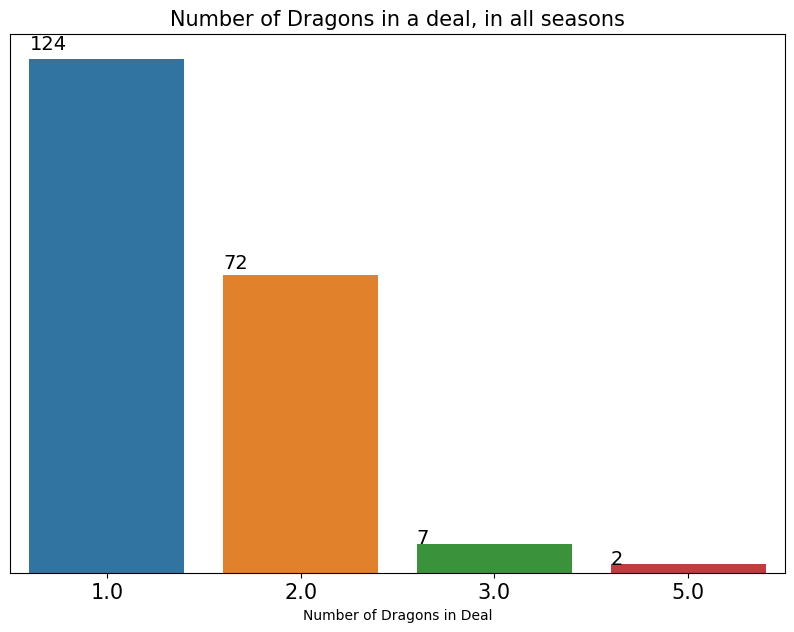

In [56]:
# Number of Dragons in a deal, in all seasons
print(dragons_den['Number of Dragons in Deal'].value_counts(), "\n")

# In percentage
print(round(dragons_den['Number of Dragons in Deal'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

fig = plt.figure(figsize=(10, 7))
plt.title("Number of Dragons in a deal, in all seasons", fontsize=15)
plt.xticks(fontsize=15)
plt.yticks([])
ax = sns.countplot(data = dragons_den, x = 'Number of Dragons in Deal')
ax.set_ylabel('')
for t in ax.patches:
    if (np.isnan(float(t.get_height()))):
        ax.annotate(0, (t.get_x(), 0))
    else:
        ax.annotate(str(format(int(t.get_height()), ',d')), (t.get_x(), t.get_height()*1.02), size=14)

In [57]:
# All Dragons deals
print(dragons_den.loc[dragons_den['Number of Dragons in Deal'] >= 5][["Season Number","Startup Name","Total Deal Amount","Total Deal Equity"]])

     Season Number Startup Name  Total Deal Amount  Total Deal Equity
383             20    MoodBears            20000.0               25.0
402             21  SopperBooks                5.0                5.0


In [58]:
# Dragons with most number of solo deals
amt_cols = dragons_den.columns[dragons_den.columns.str.contains(' Investment Amount')].tolist()
tmp = dragons_den.loc[dragons_den['Number of Dragons in Deal'] == 1][amt_cols]
tmp.count().sort_values(ascending=False).nlargest(5)

# PeterJones did most number of solo deals, than any other Dragon

Guest Investment Amount              39
Peter Jones Investment Amount        23
Deborah Meaden Investment Amount     23
Sara Davies Investment Amount        17
Touker Suleyman Investment Amount    13
dtype: int64

In [59]:
# Dragons with most number of episode presence, in all seasons
present_cols = dragons_den.columns[dragons_den.columns.str.endswith(' Present')].tolist()
tmp = dragons_den[present_cols]
tmp.sum().sort_values(ascending=False).nlargest(5)

# Peter Jones was there in most number of episodes

Guest Present              85.0
Peter Jones Present        64.0
Deborah Meaden Present     55.0
Touker Suleyman Present    33.0
Sara Davies Present        27.0
dtype: float64

In [60]:
# # Top 25 UK states of pitcher's
# tmp = dragons_den['Pitchers State'].value_counts().nlargest(20).sort_values(ascending=True)
# fig = px.bar(tmp, x=tmp.values, title="<b>Top 20 States</b> from where pitchers came from", template='simple_white', text=tmp, width=850, height=750)
# fig.update_yaxes(title_text="")
# fig.update_xaxes(visible=False)
# fig.show()

In [61]:
# # Top 20 UK cities
# tmp = dragons_den['Pitchers City'].value_counts().nlargest(20).sort_values(ascending=True)
# fig = px.bar(tmp, x=tmp.values, title="<b>Top 20 British cities</b> with number of startups came for pitching", template='simple_white', text=tmp, width=850, height=800)
# fig.update_yaxes(title_text="")
# fig.update_xaxes(visible=False)
# fig.show()

In [62]:
# Most frequently asked amount, by startups
dragons_den.groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (GBP) and Number times asked

Original Ask Amount
50000.0     121
100000.0     65
75000.0      55
80000.0      41
60000.0      37
150000.0     19
70000.0      16
40000.0      14
30000.0      10
200000.0     10
dtype: int64

In [63]:
# Most frequently offered equity, by startups
dragons_den.groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered

Original Offered Equity
25.0    70
30.0    69
40.0    65
20.0    44
10.0    43
35.0    28
15.0    23
50.0    20
45.0    15
5.0     13
dtype: int64

In [64]:
# ✅ Most frequently invested amount, by Dragons
dragons_den.groupby('Total Deal Amount').size().nlargest(10)

# Dragons mostly invested 50K per deal

# Total Deal Amount (GBP) and Number times invested

Total Deal Amount
50000.0     61
75000.0     23
60000.0     21
80000.0     21
100000.0    19
150000.0     9
70000.0      6
40000.0      4
120000.0     4
30000.0      3
dtype: int64

In [65]:
# ✅ Most frequently received total equity, by Dragons
dragons_den.groupby('Total Deal Equity').size().nlargest(10)

# Dragons are expecting more than 25% equity, in a deal

# Total Deal Equity (in %) and Number times invested

Total Deal Equity
30.0    35
25.0    34
40.0    28
20.0    22
10.0    19
35.0    11
15.0     9
45.0     9
50.0     9
5.0      5
dtype: int64

In [66]:
# Most frequently asked amount (in GBP), deals received percentage and not received percentage, in sucessful deal ✅
tmp2 = pd.crosstab(dragons_den['Original Ask Amount'], dragons_den['Deal Successful']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

,deal_percentage,no_deal_percentage
50000.0,54.0,46.0
75000.0,47.0,53.0
80000.0,57.0,43.0
60000.0,61.0,39.0
100000.0,33.0,67.0
150000.0,60.0,40.0
70000.0,44.0,56.0
200000.0,33.0,67.0
40000.0,23.0,77.0
25000.0,75.0,25.0


In [67]:
# Frequently asked amount (in GBP), deals received percentage and not received percentage, in unsucessful deal ❌
tmp2 = pd.crosstab(dragons_den['Original Ask Amount'], dragons_den['Deal Successful']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=True)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

,deal_percentage,no_deal_percentage
72000.0,0.0,100.0
110000.0,0.0,100.0
37500.0,0.0,100.0
95000.0,0.0,100.0
225000.0,0.0,100.0
66000.0,0.0,100.0
175000.0,100.0,0.0
145000.0,100.0,0.0
140000.0,100.0,0.0
136000.0,100.0,0.0


In [68]:
# Most frequently asked equity, deals received percentage and not received percentage, in sucessful deal ✅
tmp2 = pd.crosstab(dragons_den['Original Offered Equity'], dragons_den['Deal Successful']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=False)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

,deal_percentage,no_deal_percentage
30.0,53.0,47.0
25.0,52.0,48.0
40.0,43.0,57.0
20.0,54.0,46.0
10.0,63.0,37.0
35.0,41.0,59.0
15.0,47.0,53.0
45.0,60.0,40.0
50.0,45.0,55.0
5.0,62.0,38.0


In [69]:
# Fequently asked equity, deals received percentage and not received percentage, in unsucessful deal ❌
tmp2 = pd.crosstab(dragons_den['Original Offered Equity'], dragons_den['Deal Successful']).add_prefix('deal_').rename_axis(index=None, columns=None).sort_values('deal_1',ascending=True)
tmp2['deal_percentage'] = round((tmp2['deal_1'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2['no_deal_percentage'] = round((tmp2['deal_0'] / (tmp2['deal_0'] + tmp2['deal_1']))*100,0)
tmp2[['deal_percentage','no_deal_percentage']].head(10)

,deal_percentage,no_deal_percentage
2.5,0.0,100.0
48.0,0.0,100.0
44.0,0.0,100.0
39.0,0.0,100.0
24.0,0.0,100.0
22.0,0.0,100.0
18.0,0.0,100.0
16.0,0.0,100.0
23.0,0.0,100.0
100.0,0.0,100.0


In [70]:
# Mostly successful combinations (of asked amount and offered equity)
dragons_den.loc[dragons_den['Deal Successful'] == 1].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

# If you are pitching in UK Dragons' Den, ask for 50K-150K with 30-40% equity ✅

Original Ask Amount  Original Offered Equity
50000.0              25.0                       14
                     30.0                       14
                     20.0                        9
                     10.0                        8
100000.0             40.0                        6
60000.0              30.0                        5
                     40.0                        4
75000.0              25.0                        4
80000.0              25.0                        4
                     30.0                        4
dtype: int64

In [71]:
# Most frequently asked amount, by startups who could NOT get a deal
dragons_den.loc[dragons_den['Deal Successful'] == 0].groupby('Original Ask Amount').size().nlargest(10)

# Original Ask Amount (GBP) and Number times asked (but rejected by Dragons) ❌

Original Ask Amount
50000.0     52
100000.0    39
75000.0     27
80000.0     15
60000.0     13
40000.0     10
70000.0      9
150000.0     6
200000.0     6
30000.0      4
dtype: int64

In [72]:
# Most frequently offered equity, by startups who could NOT get a deal
dragons_den.loc[dragons_den['Deal Successful'] == 0].groupby('Original Offered Equity').size().nlargest(10)

# Original Offered Equity (in %) and Number times offered (but rejected by Dragons) ❌

Original Offered Equity
40.0    37
25.0    32
30.0    31
20.0    19
35.0    16
10.0    11
50.0    11
15.0    10
33.0     6
45.0     6
dtype: int64

In [73]:
# Mostly rejected combinations (of asked amount and offered equity)
dragons_den.loc[dragons_den['Deal Successful'] == 0].groupby(['Original Ask Amount','Original Offered Equity']).size().nlargest(10)

# If you are pitching in Dragons' Den US, don't ask for 100K with 50% equity or 50K with 20-40% equity 🔴

Original Ask Amount  Original Offered Equity
50000.0              40.0                       10
                     30.0                        9
100000.0             30.0                        8
50000.0              20.0                        7
                     25.0                        6
100000.0             40.0                        6
75000.0              20.0                        5
                     25.0                        5
                     40.0                        5
100000.0             10.0                        5
dtype: int64

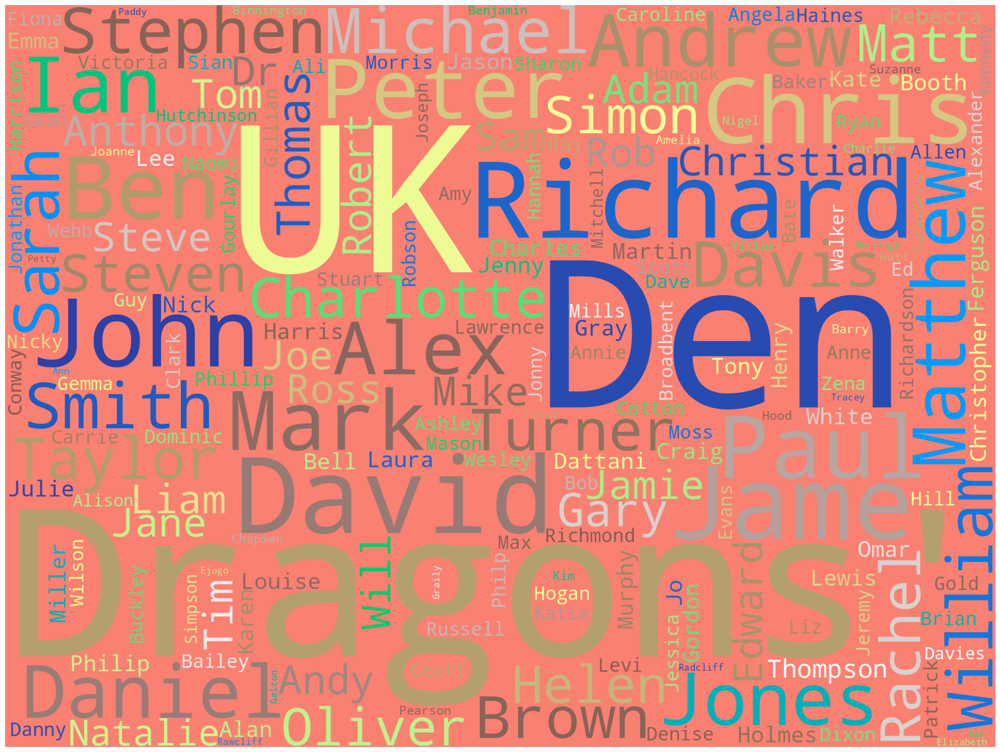

In [74]:
# Word cloud based on Pitcher name
text = " Dragons' Den UK ".join(cat for cat in dragons_den['Entrepreneur Names'].astype(str))
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='terrain_r', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [75]:
# Many (8) companies got more amount than they asked/expected
print(dragons_den.loc[dragons_den['Original Ask Amount'] < dragons_den["Total Deal Amount"]][["Startup Name"]].count())
dragons_den.loc[dragons_den['Original Ask Amount'] < dragons_den["Total Deal Amount"]][["Season Number","Startup Name","Original Ask Amount","Total Deal Amount"]]

Startup Name    8
dtype: int64


,Season Number,Startup Name,Original Ask Amount,Total Deal Amount
48,6,Neurotica,56000.0,75000.0
55,6,GuyPortelliSculptureStudio,70000.0,80000.0
58,6,TinyBox,53000.0,60000.0
74,7,MotorMouse,100000.0,120000.0
171,13,TimberkitsLtd,25000.0,40000.0
238,16,LookAfterMyBills,90000.0,120000.0
333,19,TheLittleLoop,75000.0,140000.0
336,19,LittleHoppabySophie,75000.0,100000.0


In [76]:
# Most of the companies not diluted/gave their company equity more than they initially offered/expected
dragons_den.loc[dragons_den['Original Offered Equity'] < dragons_den["Total Deal Equity"]][["Season Number","Startup Name","Original Offered Equity","Total Deal Equity"]]

,Season Number,Startup Name,Original Offered Equity,Total Deal Equity


In [77]:
# Below (197) companies got the same valuation they requested (with or without loan)
print(dragons_den.loc[dragons_den['Valuation Requested'] == dragons_den["Deal Valuation"]][["Startup Name"]].count())
dragons_den.loc[dragons_den['Valuation Requested'] == dragons_den["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    197
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
0,1,Umbrolly,375000.0,375000.0
1,1,GrailsLtd1,300000.0,300000.0
2,1,LeBeanock,110204.0,110204.0
7,1,VisualTalentLtd,437500.0,437500.0
8,2,SquareMile,375000.0,375000.0
...,...,...,...,...
415,21,TastyMates,300000.0,300000.0
419,21,Sibstar,1250000.0,1250000.0
423,21,ZebedeeAnyAngle,187500.0,187500.0
430,21,Skin,500000.0,500000.0


In [78]:
# There are 8 companies which got more valuation than they pitched
print(dragons_den.loc[dragons_den['Valuation Requested'] < dragons_den["Deal Valuation"]][["Startup Name"]].count())
dragons_den.loc[dragons_den['Valuation Requested'] < dragons_den["Deal Valuation"]][["Season Number","Startup Name","Valuation Requested","Deal Valuation"]]

Startup Name    8
dtype: int64


,Season Number,Startup Name,Valuation Requested,Deal Valuation
48,6,Neurotica,160000.0,214286.0
55,6,GuyPortelliSculptureStudio,280000.0,320000.0
58,6,TinyBox,132500.0,150000.0
74,7,MotorMouse,250000.0,300000.0
171,13,TimberkitsLtd,83333.0,133333.0
238,16,LookAfterMyBills,3000000.0,4000000.0
333,19,TheLittleLoop,300000.0,560000.0
336,19,LittleHoppabySophie,166667.0,222222.0


In [79]:
# Episodes which got most TRP
print("Maximum viewership in UK:", dragons_den['UK Viewership'].max(), "\n")
print(dragons_den.loc[dragons_den['UK Viewership']>=dragons_den['UK Viewership'].max()-0.15][["Season Number","Episode Number","Startup Name","UK Viewership"]].head(18).sort_values("UK Viewership",ascending=False).to_string(index=False))

Maximum viewership in UK: 4.39 

 Season Number  Episode Number     Startup Name  UK Viewership
             9               1   ThePresentClub           4.39
             9               1 PloughcroftSolar           4.39
            20               1            Tabuu           4.29
            20               1   TempleWellness           4.29
            20               1   PsychicSisters           4.29
             7               7   TheAnywaySpray           4.24
             7               7     PhysicoolLtd           4.24
            20               4       BidePlanet           4.24
            20               4    PopUpChessSet           4.24


In [80]:
# Episodes which got least TRP
print("Minimum viewership in United Kingdom:", dragons_den['UK Viewership'].min(), "\n")
print(dragons_den.loc[dragons_den['UK Viewership']<=dragons_den['UK Viewership'].min()+0.28][["Season Number","Episode Number","Startup Name","UK Viewership"]].head(18).sort_values("UK Viewership").to_string(index=False))

Minimum viewership in United Kingdom: 1.63 

 Season Number  Episode Number      Startup Name  UK Viewership
            10               9 KarumaInnovations           1.63
            10               9     Pro-TecCovers           1.63
            10              11          myBunjee           1.65
            10              11              P4CK           1.65
            10               4     PrimalParking           1.66
            10               2      Shampooheads           1.91
            10               6      Billy+Margot           1.91
            10               6         WoodBlocX           1.91
            10              12         Rocktails           1.91
            10              12     Megaflatables           1.91


Multiple Entrepreneurs
0    302
1    192
Name: count, dtype: Int64 

Multiple Entrepreneurs
0    61%
1    39%
Name: proportion, dtype: object


<Axes: ylabel='count'>

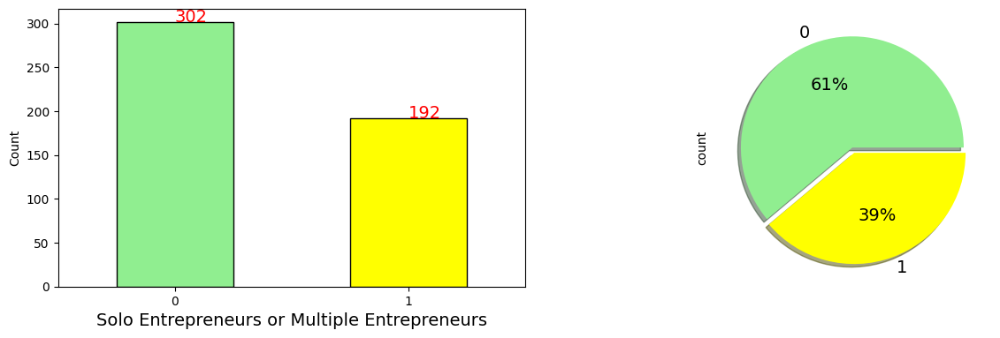

In [81]:
# Solo or multiple Entrepreneurs ?
print(dragons_den['Multiple Entrepreneurs'].value_counts(), "\n")
print(round(dragons_den['Multiple Entrepreneurs'].value_counts(normalize=True)*100).astype(str).str.replace('.0', '%', regex=False))

plt.figure(figsize = (15,9))
ax1 = plt.subplot(221)
dragons_den["Multiple Entrepreneurs"].value_counts().plot(kind='bar', color=["lightgreen","yellow"], ec="k")
plt.xlabel("Solo Entrepreneurs or Multiple Entrepreneurs", size=14)
plt.ylabel("Count")
plt.xticks(rotation=0)
for x,y in enumerate(dragons_den["Multiple Entrepreneurs"].value_counts()):
    plt.annotate(y, (x,y), fontsize=14, color="red")
    
ax2 = plt.subplot(222)
dragons_den["Multiple Entrepreneurs"].value_counts().plot(kind='pie', autopct='%.0f%%', explode = (0,0.05), colors=["lightgreen","yellow"], shadow=True, fontsize=14)

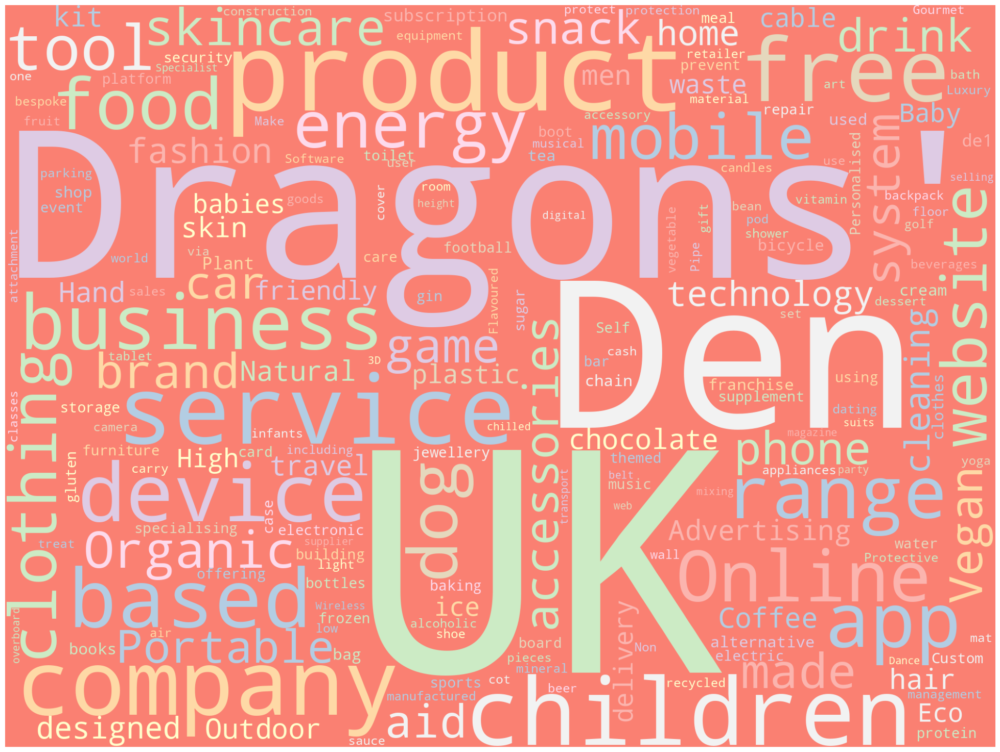

In [82]:
# Word cloud based on Business Description of startups came in all seasons
text = " Dragons' Den UK ".join(cat for cat in dragons_den.loc[dragons_den['Business Description'].notnull()]['Business Description'])
stop_words = list(STOPWORDS)
wordcloud = WordCloud(width=2000, height=1500, stopwords=stop_words, background_color='salmon', colormap='Pastel1', collocations=False, random_state=2024).generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

In [83]:
# Correlation matrix
dragons_den.corr(numeric_only=True).style.background_gradient(cmap = 'Blues')

,Season Number,Episode Number,Pitch Number,UK Viewership,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,Total Deal Equity,Deal Valuation,Number of Dragons in Deal,Investment Amount Per Dragon,Equity Per Dragon,Royalty Deal,Advisory Shares Equity,Loan,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present
Season Number,1.000000,0.372346,0.984276,0.335186,nan,nan,nan,nan,0.169168,-0.330983,-0.395268,0.130048,0.359694,-0.068986,0.020791,-0.319628,-0.488155,0.182390,0.017809,-0.176101,-0.309402,nan,nan,nan,-0.423130,-0.519033,-0.412553,-0.511232,0.104798,0.507461,-0.309453,-0.201540,-0.049379,-0.178355,-0.028429,-0.190770,-0.153935,-0.501082,nan,nan,nan,nan,nan,nan,-0.117037
Episode Number,0.372346,1.000000,0.298443,-0.151623,nan,nan,nan,nan,0.019119,-0.139376,-0.079960,-0.023683,0.145823,-0.051280,-0.084319,-0.205570,-0.061459,-0.108328,-0.007233,-0.164284,0.008741,nan,nan,nan,-0.186206,-0.232533,-0.092463,-0.187895,0.269717,0.444273,-0.315613,0.085252,-0.080918,-0.073713,-0.031224,0.181624,-0.251720,0.020599,nan,nan,nan,nan,nan,nan,-0.163820
Pitch Number,0.984276,0.298443,1.000000,0.349958,nan,nan,nan,nan,0.105790,-0.289854,-0.447648,0.186808,nan,nan,0.019439,-0.275385,-0.472595,0.192272,0.050708,-0.158006,-0.315605,nan,nan,nan,-0.396483,-0.566394,-0.410208,-0.547224,0.162688,0.607771,-0.349557,-0.210698,-0.064616,-0.173456,-0.035252,-0.144019,-0.157021,-0.485971,nan,nan,nan,nan,nan,nan,-0.147094
UK Viewership,0.335186,-0.151623,0.349958,1.000000,nan,nan,nan,nan,-0.000292,0.013443,-0.209978,0.151254,-0.251668,-0.118174,0.080159,0.054947,-0.168148,0.145190,0.113331,0.021682,-0.184312,nan,nan,nan,-0.179493,-0.235642,-0.111175,-0.381225,-0.041661,-0.692094,-0.336211,-0.128416,0.017954,-0.016927,-0.056099,-0.117867,0.100597,-0.183471,nan,nan,nan,nan,nan,nan,-0.065944
Pitchers Gender,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Pitchers Average Age,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Pitchers City,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Pitchers State,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
Multiple Entrepreneurs,0.169168,0.019119,0.105790,-0.000292,nan,nan,nan,nan,1.000000,-0.040617,-0.174655,0.117332,0.156488,0.048956,0.061014,-0.048302,-0.319001,0.205278,-0.024460,0.018482,-0.243518,nan,nan,nan,-0.260944,-0.272973,-0.170963,-0.339871,0.134099,0.360401,0.219509,0.159264,-0.099859,-0.146738,-0.211986,-0.303012,0.167093,-0.299444,nan,nan,nan,nan,nan,nan,-0.095098
Original Ask Amount,-0.330983,-0.139376,-0.289854,0.013443,nan,nan,nan,nan,-0.040617,1.000000,0.043645,0.439590,-0.093861,-0.147397,-0.064094,0.987995,0.087612,0.462737,-0.008209,0.784288,-0.025517,nan,nan,nan,0.761747,0.218835,0.664784,0.047506,0.769113,-0.326483,0.794944,0.172923,0.765332,0.261193,0.757608,-0.000611,0.799277,-0.041431,nan,

In [84]:
print("numpy version: {}". format(np.__version__))
print("pandas version: {}". format(pd.__version__))
import matplotlib
print("matplotlib version: {}". format(matplotlib. __version__))
print("seaborn version: {}". format(sns.__version__))
import plotly
print("plotly version: {}". format(plotly.__version__))

# Current Python package versions
# numpy version: 1.26.4
# pandas version: 2.2.2
# matplotlib version: 3.7.5
# seaborn version: 0.12.2
# plotly version: 5.22.0

numpy version: 1.26.4
pandas version: 2.2.2
matplotlib version: 3.7.5
seaborn version: 0.12.2
plotly version: 5.22.0


In [85]:
dragons_den.loc[(dragons_den['Deal Successful'] == 1) & (dragons_den['Total Deal Amount'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [86]:
dragons_den.loc[(dragons_den['Deal Successful'] == 1) & (dragons_den['Total Deal Equity'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [87]:
dragons_den.loc[(dragons_den['Deal Successful'] == 1) & (dragons_den['Deal Valuation'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [88]:
dragons_den.loc[(dragons_den['Deal Successful'] == 1) & (dragons_den['Number of Dragons in Deal'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [89]:
dragons_den.loc[(dragons_den['Deal Successful'] == 1) & (dragons_den['Investment Amount Per Dragon'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [90]:
dragons_den.loc[(dragons_den['Deal Successful'] == 1) & (dragons_den['Equity Per Dragon'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [91]:
dragons_den.loc[round(dragons_den['Total Deal Amount'].fillna(0),1) != round(dragons_den['Peter Jones Investment Amount'].fillna(0) + dragons_den['Deborah Meaden Investment Amount'].fillna(0) + dragons_den['Duncan Bannatyne Investment Amount'].fillna(0) + dragons_den['Theo Paphitis Investment Amount'].fillna(0) + dragons_den['Touker Suleyman Investment Amount'].fillna(0) + dragons_den['Sara Davies Investment Amount'].fillna(0) + dragons_den['Guest Investment Amount'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [92]:
dragons_den.loc[round(dragons_den['Total Deal Equity'].fillna(0),1) != round(dragons_den['Peter Jones Investment Equity'].fillna(0) + dragons_den['Deborah Meaden Investment Equity'].fillna(0) + dragons_den['Duncan Bannatyne Investment Equity'].fillna(0) + dragons_den['Theo Paphitis Investment Equity'].fillna(0) + dragons_den['Touker Suleyman Investment Equity'].fillna(0) + dragons_den['Sara Davies Investment Equity'].fillna(0) + dragons_den['Guest Investment Equity'].fillna(0), 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [93]:
dragons_den.loc[(dragons_den['Guest Investment Amount'].notnull()) & (dragons_den['Invested Guest Name'].isnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [94]:
dragons_den.loc[(dragons_den['Guest Investment Amount'].isnull()) & (dragons_den['Invested Guest Name'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [95]:
dragons_den.loc[(dragons_den['Multiple Entrepreneurs'] != 0) & (dragons_den['Multiple Entrepreneurs'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [96]:
dragons_den.loc[(dragons_den['Multiple Entrepreneurs'] == 0) & (dragons_den['Entrepreneur Names'].notnull() & dragons_den['Entrepreneur Names'].str.contains(' and'))]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present
436,21,Nail Pad,14,<NA>,4-Jan-24,4-Apr-24,4-Apr-24,nan,Self-manicure aids,NaN,NaN,BBC One,NaN,NaN,NaN,NaN,Carrie and Tori,0,60000.0,35.0,171429.0,0,<NA>,<NA>,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [97]:
dragons_den.loc[(dragons_den['Multiple Entrepreneurs'] == 1) & (dragons_den['Entrepreneur Names'].str.contains(' and ')==False)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present
476,1,Dragons Cars,4,<NA>,4-Jan-05,8-Feb-05,25-Jan-05,nan,Racing car designed for public roads,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Jenny & Bill Conway,1,NaN,NaN,NaN,0,<NA>,<NA>,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [98]:
dragons_den.loc[(dragons_den['Deal Successful'] != 0) & (dragons_den['Deal Successful'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [99]:
dragons_den.loc[(dragons_den['Deal Successful'] == 0) & (dragons_den['Total Deal Amount'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [100]:
dragons_den.loc[(dragons_den['Pitchers Gender'] == 'Mixed Team') & (dragons_den['Multiple Entrepreneurs'] != 1)]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [101]:
dragons_den.loc[(dragons_den['Deal Successful'] == 0) & (dragons_den['Invested Guest Name'].notnull())]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present


In [102]:
dragons_den.loc[dragons_den['Total Deal Amount'] < dragons_den["Loan"]]

,Season Number,Startup Name,Episode Number,Pitch Number,Season Start,Season End,Original Air Date,Industry,Business Description,Company Website,UK Viewership,Channel Name,Pitchers Gender,Pitchers Average Age,Pitchers City,Pitchers State,Entrepreneur Names,Multiple Entrepreneurs,Original Ask Amount,Original Offered Equity,Valuation Requested,Received Offer,Accepted Offer,Deal Successful,Total Deal Amount,...,Advisory Shares Equity,Loan,Deal Has Conditions,Peter Jones Investment Amount,Peter Jones Investment Equity,Deborah Meaden Investment Amount,Deborah Meaden Investment Equity,Duncan Bannatyne Investment Amount,Duncan Bannatyne Investment Equity,Theo Paphitis Investment Amount,Theo Paphitis Investment Equity,Touker Suleyman Investment Amount,Touker Suleyman Investment Equity,Sara Davies Investment Amount,Sara Davies Investment Equity,Guest Investment Amount,Guest Investment Equity,Invested Guest Name,Peter Jones Present,Deborah Meaden Present,Duncan Bannatyne Present,Theo Paphitis Present,Touker Suleyman Present,Sara Davies Present,Guest Present
